In [1]:
import warnings
warnings.filterwarnings(action="ignore")

In [2]:
import pandas as pd
import numpy as np
import time
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score,confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.decomposition import PCA
from sklearn.tree import DecisionTreeClassifier

from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier

In [3]:
# Reading data
data = pd.read_csv("credit_risk_dataset.csv")

In [4]:
# Shape of data
data.shape

(32581, 12)

In [5]:
# head of data
data.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4


In [6]:
# Info of data features
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32581 entries, 0 to 32580
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   person_age                  32581 non-null  int64  
 1   person_income               32581 non-null  int64  
 2   person_home_ownership       32581 non-null  object 
 3   person_emp_length           31686 non-null  float64
 4   loan_intent                 32581 non-null  object 
 5   loan_grade                  32581 non-null  object 
 6   loan_amnt                   32581 non-null  int64  
 7   loan_int_rate               29465 non-null  float64
 8   loan_status                 32581 non-null  int64  
 9   loan_percent_income         32581 non-null  float64
 10  cb_person_default_on_file   32581 non-null  object 
 11  cb_person_cred_hist_length  32581 non-null  int64  
dtypes: float64(3), int64(5), object(4)
memory usage: 3.0+ MB


In [7]:
# Data Description
data.describe()

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length
count,32581.000000,3.258100e+04,31686.000000,32581.000000,29465.000000,32581.000000,32581.000000,32581.000000
mean,27.734600,6.607485e+04,4.789686,9589.371106,11.011695,0.218164,0.170203,5.804211
std,6.348078,6.198312e+04,4.142630,6322.086646,3.240459,0.413006,0.106782,4.055001
min,20.000000,4.000000e+03,0.000000,500.000000,5.420000,0.000000,0.000000,2.000000
25%,23.000000,3.850000e+04,2.000000,5000.000000,7.900000,0.000000,0.090000,3.000000
50%,26.000000,5.500000e+04,4.000000,8000.000000,10.990000,0.000000,0.150000,4.000000
75%,30.000000,7.920000e+04,7.000000,12200.000000,13.470000,0.000000,0.230000,8.000000
max,144.000000,6.000000e+06,123.000000,35000.000000,23.220000,1.000000,0.830000,30.000000


In [8]:
# Dropping null values along axis = 0(Row)
data.dropna(inplace=True,axis=0)
data.shape

(28638, 12)

# Getting Insights (Visualization)

### person_age

In [9]:
px.violin(data,y="person_age",color="loan_status",points="all")

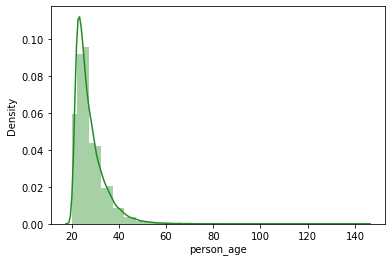

In [10]:
sns.distplot(data.person_age,label="person_age",color ="forestgreen")
plt.show()

### person_income

In [11]:
px.violin(data,x="person_income",color="loan_status",points="all")

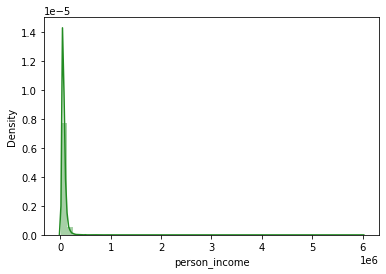

In [12]:
sns.distplot(data.person_income,label="person_income",color ="forestgreen")
plt.show()

### person_home_ownership

In [13]:
data.person_home_ownership.value_counts()

RENT        14551
MORTGAGE    11801
OWN          2192
OTHER          94
Name: person_home_ownership, dtype: int64

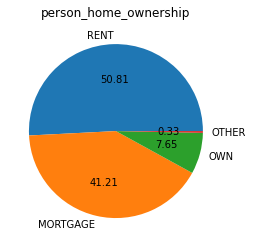

In [14]:
plt.title("person_home_ownership")
plt.pie(data.person_home_ownership.value_counts(),labels = data.person_home_ownership.value_counts().index,autopct = "%0.2f")
plt.show()

### person_emp_length

In [15]:
px.violin(data,y="person_emp_length",color="loan_status",points="all")

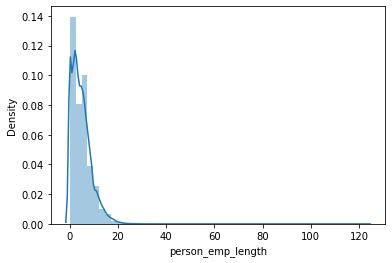

In [16]:
sns.distplot(data.person_emp_length,label = "person_emp_length")
plt.show()

### loan_intent

In [17]:
data.loan_intent.value_counts()

EDUCATION            5704
MEDICAL              5293
VENTURE              5001
PERSONAL             4877
DEBTCONSOLIDATION    4565
HOMEIMPROVEMENT      3198
Name: loan_intent, dtype: int64

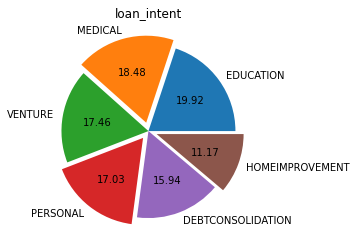

In [18]:
plt.title("loan_intent")
plt.pie(data.loan_intent.value_counts(),labels = data.loan_intent.value_counts().index,autopct = "%0.2f",explode=[0,0.1,0,0.1,0,0.1])
plt.show()

### loan_grade

In [19]:
data.loan_grade.value_counts()

A    9402
B    9151
C    5699
D    3248
E     870
F     209
G      59
Name: loan_grade, dtype: int64

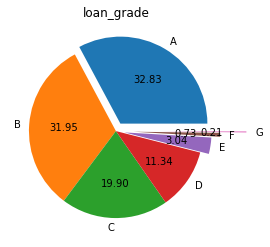

In [20]:
plt.title("loan_grade")
plt.pie(data.loan_grade.value_counts(),labels = data.loan_grade.value_counts().index,autopct = "%0.2f",explode=[0.1,0,0.0,0,0.1,0.2,0.5])
plt.show()

### loan_amnt

In [21]:
px.box(data,y="loan_amnt",color="loan_status",points="all")

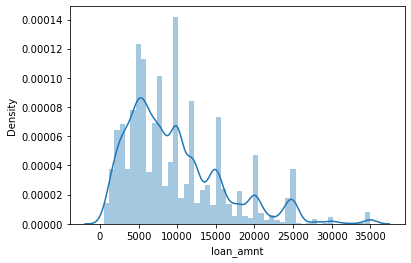

In [22]:
sns.distplot(data.loan_amnt,label = "loan_amnt")
plt.show()

### loan_int_rate

In [23]:
px.box(data,y="loan_int_rate",color="loan_status",points="all")

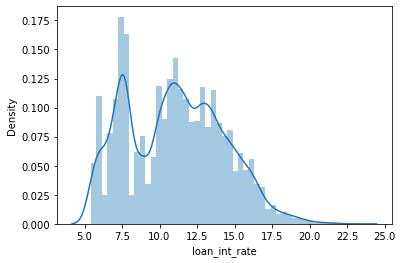

In [24]:
sns.distplot(data.loan_int_rate,label = "loan_amnt")
plt.show()

### loan_percent_income

In [25]:
px.box(data,y="loan_percent_income",color="loan_status",points="all")

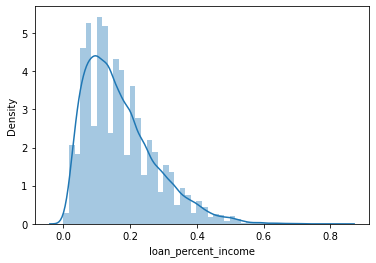

In [26]:
sns.distplot(data.loan_percent_income,label = "loan_percent_income")
plt.show()

### cb_person_default_on_file

In [27]:
data.cb_person_default_on_file.value_counts()

N    23535
Y     5103
Name: cb_person_default_on_file, dtype: int64

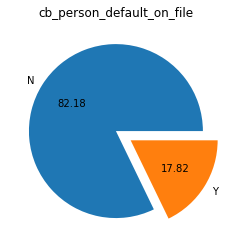

In [28]:
plt.title("cb_person_default_on_file")
plt.pie(data.cb_person_default_on_file.value_counts(),labels = data.cb_person_default_on_file.value_counts().index,autopct = "%0.2f",explode=[0,0.2])
plt.show()

### cb_person_cred_hist_length

In [29]:
data.cb_person_cred_hist_length.value_counts()

3     5233
4     5228
2     5224
7     1673
8     1665
9     1664
5     1660
6     1643
10    1635
14     436
12     426
11     410
13     387
16     387
15     370
17     347
20      29
24      27
28      22
22      21
23      19
30      19
19      18
27      18
21      18
25      17
26      16
18      15
29      11
Name: cb_person_cred_hist_length, dtype: int64

### loan_status

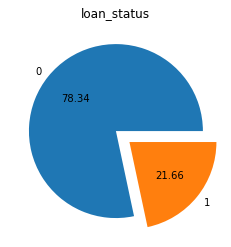

In [30]:
plt.title("loan_status")
plt.pie(data.loan_status.value_counts(),labels = data.loan_status.value_counts().index,autopct = "%0.2f",explode=[0,0.2])
plt.show()

### Parallel Plot

In [31]:
px.parallel_categories(data,color="loan_status")

### Data Report

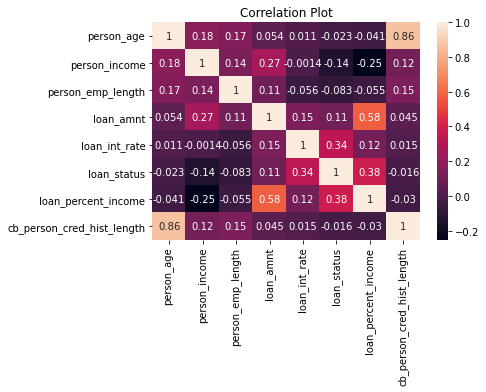

In [32]:
plt.title("Correlation Plot")
sns.heatmap(data.corr(),annot=True)
plt.show()

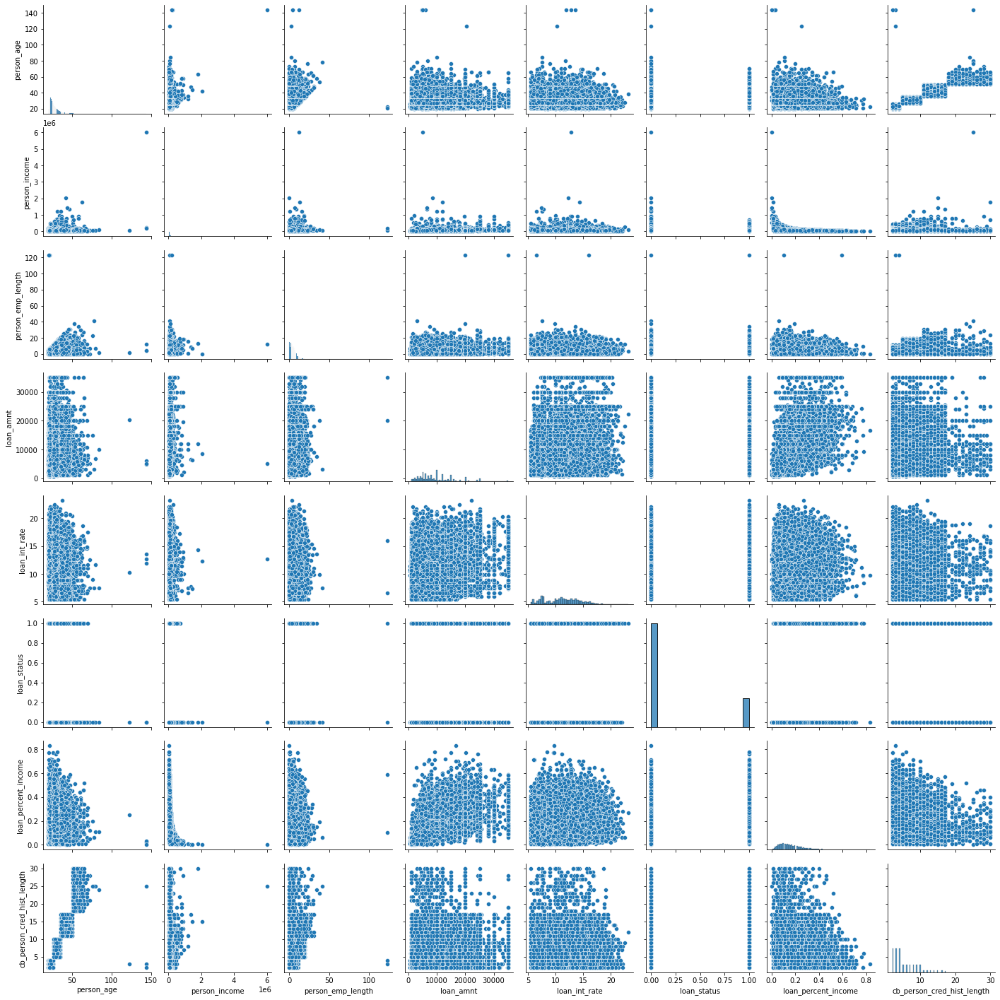

In [33]:
sns.pairplot(data, kind="scatter")
plt.show()

# Data Preprocessing

In [34]:
# filling person_emp_length with null values
data.person_emp_length.fillna(value = data.person_emp_length.mean(),inplace=True)
# filling loan_int_rate null values with mean
data.loan_int_rate.fillna(value = data.loan_int_rate.mean(),inplace=True)

In [35]:
data = pd.get_dummies(data)
labels =data.loan_status
data.drop(["loan_status"],axis=1,inplace=True)

In [36]:
scaler = MinMaxScaler()
data = scaler.fit_transform(data.values)

In [37]:
X_train,X_test,Y_train,Y_test = train_test_split(data,labels,stratify=labels,random_state=42)

In [38]:
px.pie(names=Y_test,height=400,width=400,hole=0.5,title='Label distribution in Validation Data')

In [39]:
def scores(Y_true,Y_pred):
    accuracy = accuracy_score(Y_true,Y_pred)
    fscore = f1_score(Y_true,Y_pred)
    recall = recall_score(Y_true,Y_pred)
    precision = precision_score(Y_true,Y_pred)
    confuison = confusion_matrix(Y_true,Y_pred)
    return accuracy,recall,precision,fscore,confuison

# Models

# Original Data

## Traditional Approach

#### Logistic Regression

In [40]:
log_reg = LogisticRegression()

start = time.time()
log_reg.fit(X_train,Y_train)
logistic_trainTime = time.time() - start

logistic_predValues = log_reg.predict(X_test)
accuracy_log,recall_log,precision_log,fscore_log,confusion = scores(Y_test,logistic_predValues)

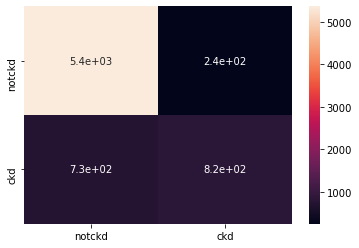

In [41]:
# Plotting Confusion Matrix
sns.heatmap(confusion,annot = True,xticklabels = ["notckd","ckd"],yticklabels = ["notckd","ckd"])
plt.show()

#### Naive Bayes

In [42]:
naive_clf = GaussianNB()

start = time.time()
naive_clf.fit(X_train,Y_train)
naive_trainTime = time.time() - start

naive_predValues = naive_clf.predict(X_test)
accuracy_naive,recall_naive,precision_naive,fscore_naive,confusion = scores(Y_test,naive_predValues)

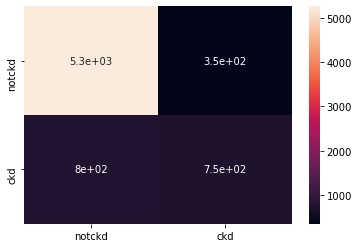

In [43]:
# Plotting Confusion Matrix
sns.heatmap(confusion,annot = True,xticklabels = ["notckd","ckd"],yticklabels = ["notckd","ckd"])
plt.show()

#### Decision Tree Classifier

In [44]:
tree_clf = DecisionTreeClassifier()

start = time.time()
tree_clf.fit(X_train,Y_train)
tree_trainTime = time.time() - start

tree_predValues = tree_clf.predict(X_test)
accuracy_tree,recall_tree,precision_tree,fscore_tree,confusion = scores(Y_test,tree_predValues)

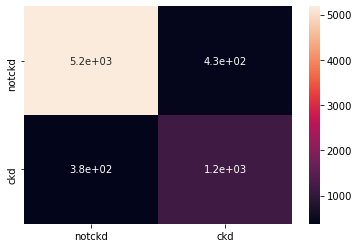

In [45]:
# Plotting Confusion Matrix
sns.heatmap(confusion,annot = True,xticklabels = ["notckd","ckd"],yticklabels = ["notckd","ckd"])
plt.show()

## Comparison of traditional approach

In [46]:
data_comparison=[[logistic_trainTime,accuracy_log,recall_log,precision_log,fscore_log],[naive_trainTime,accuracy_naive,recall_naive,precision_naive,fscore_naive],
     [tree_trainTime,accuracy_tree,recall_tree,precision_tree,fscore_tree]]

comparison_tabel1 = pd.DataFrame(data_comparison,index= ['Logistic-Regression','Naive Bayes','Decision-Tree'],columns=['Time','Accuracy','Recall','Precision','F1-Score'])

comparison_tabel1.loc[:,"Accuracy":"F1-Score"] = comparison_tabel1.loc[:,"Accuracy":"F1-Score"]*100
comparison_tabel1

,Time,Accuracy,Recall,Precision,F1-Score
Logistic-Regression,0.257309,86.382682,52.804642,77.118644,62.686567
Naive Bayes,0.015001,83.952514,48.420374,68.272727,56.657865
Decision-Tree,0.185539,88.784916,75.693101,73.375000,74.516027


## Ensemble Learning Approach

#### Random Forest Classifier

In [47]:
rnd_clf = RandomForestClassifier()

start = time.time()
rnd_clf.fit(X_train,Y_train)
forest_trainTime = time.time() - start

randomForest_predValues = rnd_clf.predict(X_test)
accuracy_rnd,recall_rnd,precision_rnd,fscore_rnd,confusion = scores(Y_test,randomForest_predValues)


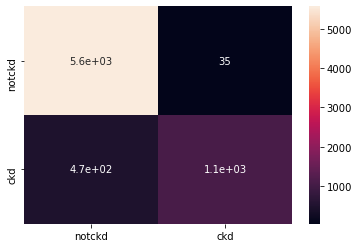

In [48]:
# Plotting Confusion Matrix
sns.heatmap(confusion,annot = True,xticklabels = ["notckd","ckd"],yticklabels = ["notckd","ckd"])
plt.show()

#### Ada Boost Classifier

In [49]:
ada_clf = AdaBoostClassifier()

start = time.time()
ada_clf.fit(X_train,Y_train)
ada_trainTime = time.time() - start

ada_predValues = ada_clf.predict(X_test)
accuracy_ada,recall_ada,precision_ada,fscore_ada,confusion = scores(Y_test,ada_predValues)


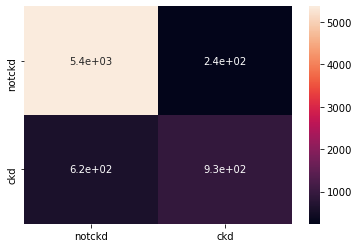

In [50]:
# Plotting Confusion Matrix
sns.heatmap(confusion,annot = True,xticklabels = ["notckd","ckd"],yticklabels = ["notckd","ckd"])
plt.show()

#### LightGBM Classifier

In [51]:
lgbm_clf = LGBMClassifier()

start = time.time()
lgbm_clf.fit(X_train,Y_train)
lgbm_trainTime = time.time() - start

lgbm_predValues = lgbm_clf.predict(X_test)
accuracy_lgbm,recall_lgbm,precision_lgbm,fscore_lgbm,confusion = scores(Y_test,lgbm_predValues)


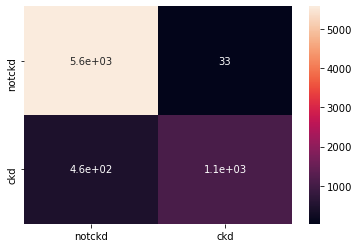

In [52]:
# Plotting Confusion Matrix
sns.heatmap(confusion,annot = True,xticklabels = ["notckd","ckd"],yticklabels = ["notckd","ckd"])
plt.show()

#### XGBoost Classifier

In [53]:
xgb_clf = XGBClassifier()

start = time.time()
xgb_clf.fit(X_train,Y_train)
xgb_trainTime = time.time() - start

xgb_predValues = xgb_clf.predict(X_test)
accuracy_xgb,recall_xgb,precision_xgb,fscore_xgb,confusion = scores(Y_test,xgb_predValues)


[02:38:21] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


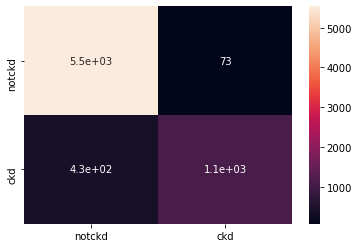

In [54]:
# Plotting Confusion Matrix
sns.heatmap(confusion,annot = True,xticklabels = ["notckd","ckd"],yticklabels = ["notckd","ckd"])
plt.show()

### Comparison of Ensemble Learning Approach

In [55]:
data_comparison = [[forest_trainTime,accuracy_rnd,recall_rnd,precision_rnd,fscore_rnd],
                  [ada_trainTime,accuracy_ada,recall_ada,precision_ada,fscore_ada],
                  [lgbm_trainTime,accuracy_lgbm,recall_lgbm,precision_lgbm,fscore_lgbm],
                  [xgb_trainTime,accuracy_xgb,recall_xgb,precision_xgb,fscore_xgb]]
comparison_tabel2 = pd.DataFrame(data_comparison,index= ['Random-Forest-Classifier','Ada-Boost-Classifier','LightGBM-Classifier','XGBoost-Classifier'],
                                 columns=['Time','Accuracy','Recall','Precision','F1-Score'])

In [56]:
comparison_tabel2.loc[:,"Accuracy":"F1-Score"] = comparison_tabel2.loc[:,"Accuracy":"F1-Score"]*100
comparison_tabel2

,Time,Accuracy,Recall,Precision,F1-Score
Random-Forest-Classifier,2.425540,92.946927,69.696970,96.863799,81.064867
Ada-Boost-Classifier,0.983833,88.016760,60.090264,79.590094,68.479060
LightGBM-Classifier,0.265521,93.184358,70.664088,97.077059,81.791045
XGBoost-Classifier,1.123041,93.030726,72.533849,93.906511,81.847945


### Comparison of all training methods

In [57]:
table_org = comparison_tabel1.append(comparison_tabel2)
table_org

,Time,Accuracy,Recall,Precision,F1-Score
Logistic-Regression,0.257309,86.382682,52.804642,77.118644,62.686567
Naive Bayes,0.015001,83.952514,48.420374,68.272727,56.657865
Decision-Tree,0.185539,88.784916,75.693101,73.375000,74.516027
Random-Forest-Classifier,2.425540,92.946927,69.696970,96.863799,81.064867
Ada-Boost-Classifier,0.983833,88.016760,60.090264,79.590094,68.479060
LightGBM-Classifier,0.265521,93.184358,70.664088,97.077059,81.791045
XGBoost-Classifier,1.123041,93.030726,72.533849,93.906511,81.847945


In [58]:
def plot(values_org,index,cName):
    plt.title(cName)
    plt.plot(index,values_org,"*--r")
    plt.legend()
    plt.xticks(rotation=70)
    plt.show()

No handles with labels found to put in legend.


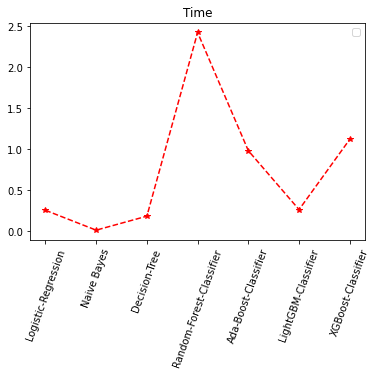

In [59]:
plot(table_org["Time"],table_org.index,"Time")

No handles with labels found to put in legend.


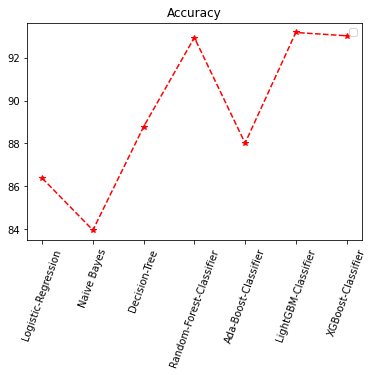

In [60]:
plot(table_org["Accuracy"],table_org.index,"Accuracy")

No handles with labels found to put in legend.


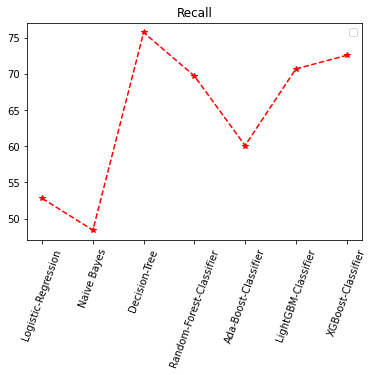

In [61]:
plot(table_org["Recall"],table_org.index,"Recall")

No handles with labels found to put in legend.


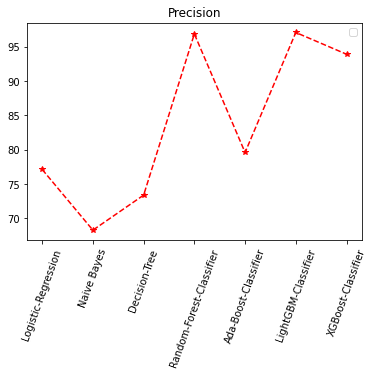

In [62]:
plot(table_org["Precision"],table_org.index,"Precision")

No handles with labels found to put in legend.


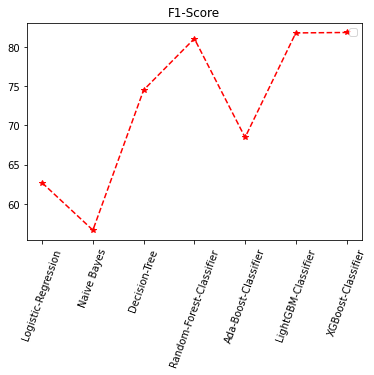

In [63]:
plot(table_org["F1-Score"],table_org.index,"F1-Score")